# Bokeh visualization and blur experiments
For this experiment, we used bokeh to visualize the feature spaces and we also calculate the blur and remove blurry images

In [9]:
from DatasetWiz.loader import DataLoader
from DatasetWiz.model import CustomModel
from DatasetWiz.visualizer import FeatureSpaceVisualizer
from DatasetWiz.metrics import Metrics
from DatasetWiz.evaluation import ModelEvaluator
from bokeh.plotting import show

In [2]:
from bokeh.palettes import Category20c
from bokeh.transform import factor_cmap

def visualize_outliers(high_dim, low_dim,  data_loader):

    # high_dim = self.original_feature_space
    # low_dim = self.low_dim_feature_space
    true_labels = data_loader.labels
    minpts = int(np.sqrt(len(true_labels)))
    # Perform HDBSCAN
    hdbscan_model = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, approx_min_span_tree=True,
    gen_min_span_tree=False, leaf_size=40,
    metric='euclidean', min_cluster_size=5, min_samples=None, p=None)

    # Get high dim labels
    high_dim_labels= hdbscan_model.fit_predict(high_dim)
    low_dim_labels = hdbscan_model.fit_predict(low_dim)

    # Get outliers 
    high_dim_outliers  = (high_dim_labels == -1)
    print('High dim outliers:', np.sum(high_dim_outliers))
    low_dim_outliers = (low_dim_labels == -1)
    print('low dim outliers:', np.sum(low_dim_outliers))


    custom_color_palette = [
    "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd",
    "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf",
    "#1a9850", "#d73027", "#7570b3", "#e7298a", "#66a61e",
    "#e6ab02", "#a6761d", "#666666", "#1b9e77", "#d95f02",
    "#7570b3", "#e7298a", "#66a61e", "#e6ab02", "#a6761d"]
    
    
    #  For true labels
    true_unique_labels = list(set(true_labels))
    true_num_classes = len(true_unique_labels)
    true_class_names = data_loader.class_labels()
    true_color_mapping = {label: color for label, color in zip(true_unique_labels, custom_color_palette)}
    true_point_colors = [true_color_mapping[label] for label in true_labels]

    # Define a color for outliers (e.g., red)
    outlier_color = "#FF0000"  # Red for outliers
    
    # Create a list of colors for each data point based on whether it's an outlier or not
    outlier_colors = [outlier_color if is_outlier else color for is_outlier, color in zip(low_dim_outliers, true_point_colors)]

    source = ColumnDataSource(data=dict(
        x=low_dim[:, 0],  # x-coordinates of points
        y=low_dim[:, 1],  # y-coordinates of points
        cluster_label= true_class_names,
        color=outlier_colors# Cluster labels for each point
    ))

    p = figure( title='Visualization of HDBSCAN Clusters in 2D Space')

    # Add scatter points to the Bokeh figure
    p.scatter(x='x', y='y', source=source, size=8, color='color', legend_field='cluster_label', fill_alpha=0.7)
    # p.scatter(x='y', y='x', source=source, size=8, color='color', legend_field='cluster_label', fill_alpha=0.7)
    
    # Customize the appearance of the plot
    p.legend.title = 'Cluster Label'
    p.xaxis.axis_label = 'Dimension 1 (t-SNE)'
    p.yaxis.axis_label = 'Dimension 2 (t-SNE)'
    
    # Show the Bokeh plot
    show(p)


# visualize_outliers(efficientnet.features, efficientnet_tsne.low_dim_feature_space,dataset_loader )   


# Main Code

### Loading a dataset

In [19]:
mattendichtung_loader = DataLoader(f"C:/Users/hdn7rng\Desktop\Experiments\datasets\Mattendichtung")
# # around 25 mislabelled images "outliers" removed
# clean_mattendichtung_loader = DataLoader(f"C:/Users/hdn7rng\Desktop\Experiments\datasets\Mattendichtung no mislabels")
# #removed 370 blurred images
# noblur_mattendichtung_loader = DataLoader(f"C:/Users/hdn7rng\Desktop\Experiments\datasets\Mattendichtung no blur")

#no blur low threshold (removed only a few images)
# fewblur_mattendichtung_loader = DataLoader(f"C:/Users/hdn7rng\Desktop\Experiments\datasets\Mattendichtung no mislabels")

# nut_loader = DataLoader(f"C:/Users/hdn7rng/Desktop/Experiments/datasets/ASQMM_CUSTOM")
# peg_loader = DataLoader(f"C:/Users/hdn7rng/Desktop/Experiments/datasets/PEG")
nut_loader = DataLoader(f"C:/Users/hdn7rng/Desktop/Experiments/datasets/metal_nutold")
screw_loader = DataLoader( f"C:/Users/hdn7rng/Desktop/Experiments/datasets/screw")
# bottle_loader = DataLoader( f"C:/Users/hdn7rng/Desktop/Experiments/datasets/bottle")
# cable_loader = DataLoader( f"C:/Users/hdn7rng/Desktop/Experiments/datasets/cable")
# capsule_loader = DataLoader( f"C:/Users/hdn7rng/Desktop/Experiments/datasets/capsule")
# catdog_loader = DataLoader( f"C:/Users/hdn7rng/Desktop/Experiments/datasets/organic/catdog")



dataset_loader = mattendichtung_loader
# clean_dataset_loader = clean_peg_loader
# noblur_dataset_loader = noblur_mattendichtung_loader


Found 5600 files belonging to 4 classes.
Found 358 files belonging to 2 classes.
Found 480 files belonging to 6 classes.


### Visualizing the dataset

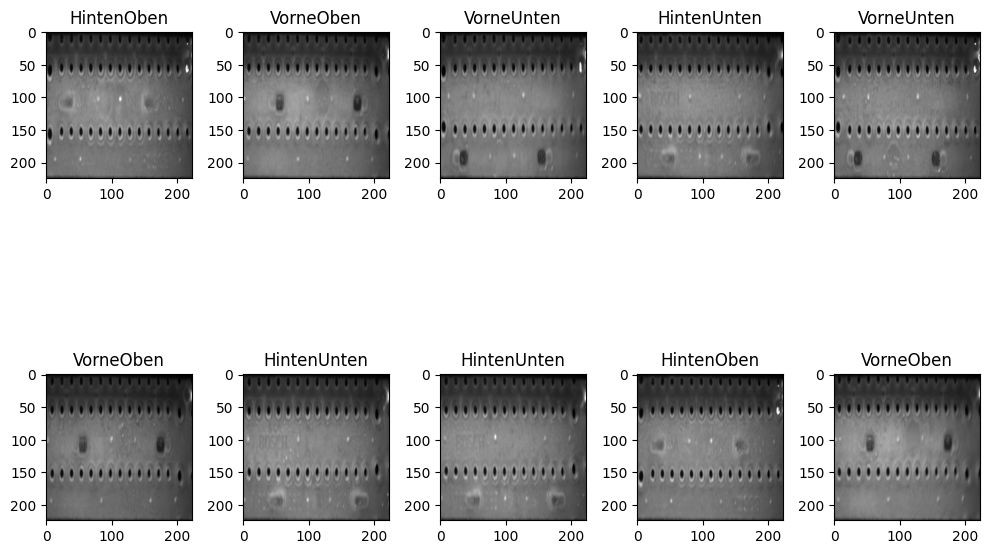

In [20]:
dataset_loader.visualize_grid(num_samples = 10)

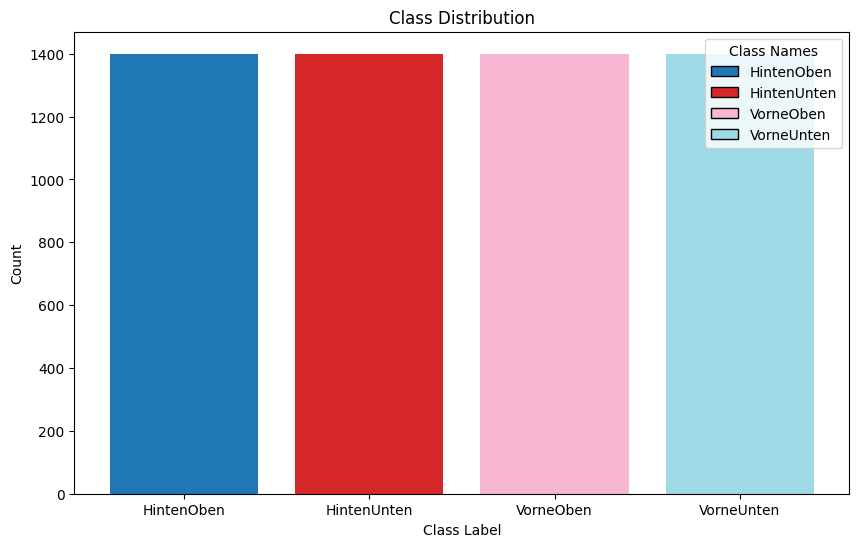

In [21]:
dataset_loader.visualize_class_distribution()

### Extracting the features

In [22]:
resnet = CustomModel(model_name='resnet50', data_loader = dataset_loader)
resnet.extract_features()

efficientnet = CustomModel(model_name= 'efficientnet', data_loader = dataset_loader)
efficientnet_features = efficientnet.extract_features()

175/175 [==============================] - 11s 61ms/step
resnet50 extracted feature space size : (5600, 2048)
175/175 [==============================] - 10s 51ms/step
efficientnet extracted feature space size : (5600, 1280)


### Plotting the reduced features (TSNE)
We also visualize and compare EfficientNet vs ResNet generated feature spaces

TSNE reduced resnet50 feature space shape : (5600, 2)


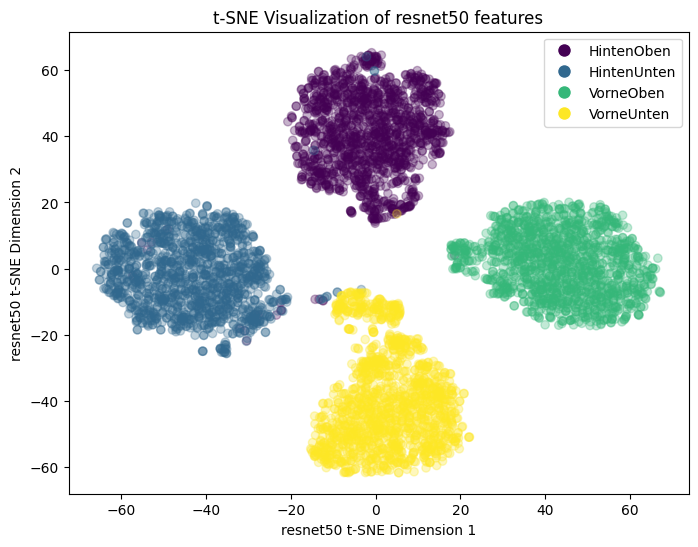

HDBSCAN Adjusted Rand Index (ARI -1-1): 0.94
HDBSCAN Normalized Mutual Information (NMI 0-1): 0.92
HDBSCAN Fowlkes-Mallows Score (0-1): 0.96
HDBSCAN Vmeasure (0-1): 0.92
HDBSCAN post clustering Silhouette: 0.32
HDBSCAN post clustering calinski_harabasz_index: 1624.85
HDBSCAN post clustering davies_bouldin_index: 1.64
HDBSCAN post clustering s_dbw: 0.70


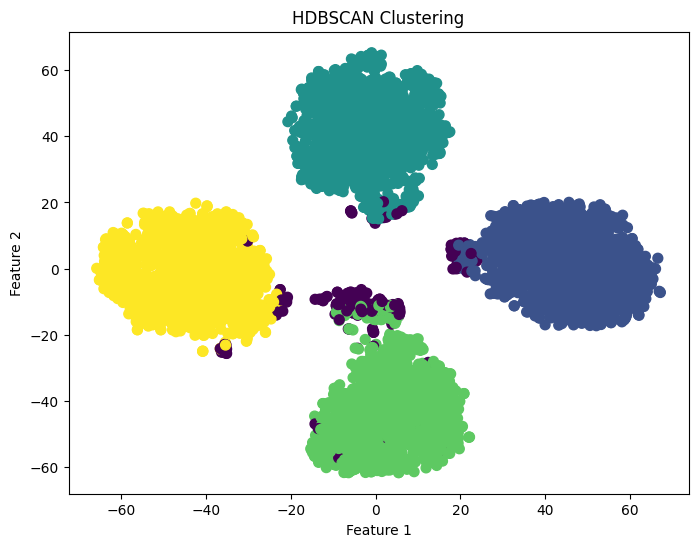

-------------------------------------------------------------------------------------------------------


TSNE reduced efficientnet feature space shape : (5600, 2)


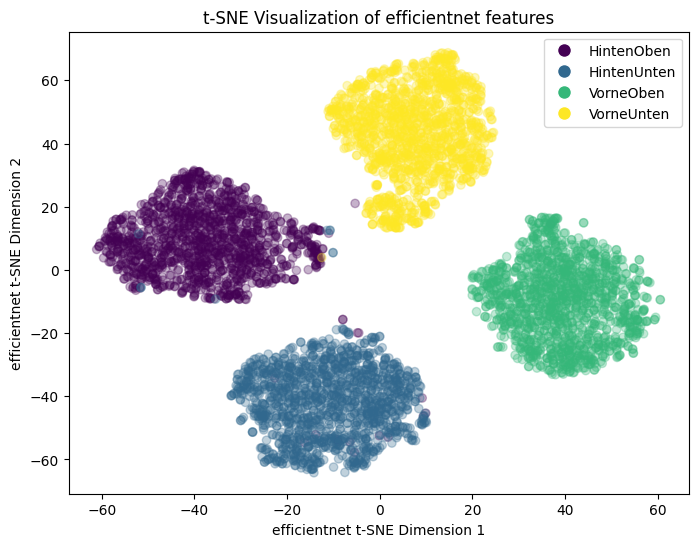

HDBSCAN Adjusted Rand Index (ARI -1-1): 0.95
HDBSCAN Normalized Mutual Information (NMI 0-1): 0.93
HDBSCAN Fowlkes-Mallows Score (0-1): 0.96
HDBSCAN Vmeasure (0-1): 0.93
HDBSCAN post clustering Silhouette: 0.37
HDBSCAN post clustering calinski_harabasz_index: 2677.24
HDBSCAN post clustering davies_bouldin_index: 1.61
HDBSCAN post clustering s_dbw: 0.60


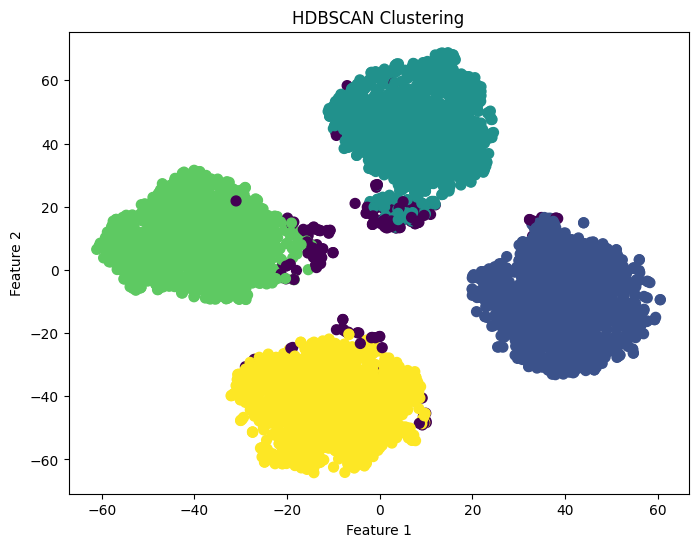

{'HDBSCANari': 0.9473323568676626,
 'HDBSCANnmi': 0.9263809146979795,
 'HDBSCANfm': 0.9605650526490568,
 'HDBSCANvm': 0.9263809146979795,
 'HDBSCANsilhouette': 0.37452725,
 'HDBSCANcalinski_harabasz_index': 2677.2432387824324,
 'HDBSCANs_dbw': 0.5975036969864925,
 'HDBSCANdavies_bouldin_index': 1.6087593007747294}

In [23]:
resnet_tsne = FeatureSpaceVisualizer(resnet,reduction_method='tsne' )
resnet_tsne.visualize()
resnet_tsne.hdbscan_clustering()
print('-------------------------------------------------------------------------------------------------------\n\n')
efficientnet_tsne = FeatureSpaceVisualizer(efficientnet,reduction_method='tsne' )
efficientnet_tsne.visualize()
efficientnet_tsne.hdbscan_clustering()

### Bokeh interactive plots
Here we use bokeh to generate interavtive plots to show images of the points in scatterplot. Also adds functionality to zoom, pan etc 

In [24]:
x = resnet_tsne.visualize_bokeh()
show(x)

In [138]:
show(efficientnet_tsne.visualize_bokeh())

### Calculating the high dimensional metrics

In [28]:
print('-----------------RESNET METRICS--------------------------------------------------------------------------------------\n')

resnet_metrics = Metrics(feature_space = resnet.features, data_loader = dataset_loader)
print('-------------------------------------------------------------------------------------------------------\n\n')

print('-----------------------EfficientNET METRICS-------------------------------------------------------------------------------\n')
efficientnet_metrics_metrics = Metrics(feature_space = efficientnet.features, data_loader = dataset_loader)
print('-------------------------------------------------------------------------------------------------------\n\n')

# clean_resnet_metrics = Metrics(feature_space = clean_resnet.features, data_loader = clean_dataset_loader)
# print('-------------------------------------------------------------------------------------------------------\n\n')

# noblur_resnet_metrics = Metrics(feature_space = noblur_resnet.features, data_loader = noblur_dataset_loader)


-----------------RESNET METRICS--------------------------------------------------------------------------------------

# of outliers : 43.000
Silhouette score : 0.317
Davies Bouldin Index *: 1.402
Calinski Harabasz Index: 1910.018
S_Dbw *: 0.700
-------------------------------------------------------------------------------------------------------


-----------------------EfficientNET METRICS-------------------------------------------------------------------------------

# of outliers : 117.000
Silhouette score : 0.370
Davies Bouldin Index *: 1.157
Calinski Harabasz Index: 3292.280
S_Dbw *: 0.600
-------------------------------------------------------------------------------------------------------




## Calculating low dimension metrics

In [27]:
print('-----------------RESNET METRICS --------------------------------------------------------------------------------------\n')
resnet_metrics = Metrics(feature_space = resnet_tsne.low_dim_feature_space, data_loader = dataset_loader)
print('-------------------------------------------------------------------------------------------------------\n\n')

print('-----------------EFFICIENTNET --------------------------------------------------------------------------------------\n')
efficientnet_metrics = Metrics(feature_space = efficientnet_tsne.low_dim_feature_space, data_loader = dataset_loader)
print('-------------------------------------------------------------------------------------------------------\n\n')

# clean_resnet_metrics = Metrics(feature_space = clean_resnet_tsne.low_dim_feature_space, data_loader = clean_dataset_loader)
# print('-------------------------------------------------------------------------------------------------------\n\n')

# noblur_resnet_metrics = Metrics(feature_space = noblur_resnet_tsne.low_dim_feature_space, data_loader = noblur_dataset_loader)


-----------------RESNET METRICS --------------------------------------------------------------------------------------

# of outliers : 5.000
Silhouette score : 0.640
Davies Bouldin Index *: 0.485
Calinski Harabasz Index: 13380.549
S_Dbw *: 0.349
-------------------------------------------------------------------------------------------------------


-----------------EFFICIENTNET --------------------------------------------------------------------------------------

# of outliers : 2.000
Silhouette score : 0.640
Davies Bouldin Index *: 0.487
Calinski Harabasz Index: 13637.581
S_Dbw *: 0.347
-------------------------------------------------------------------------------------------------------




In [29]:
efficientnet_metrics = Metrics(feature_space = efficientnet.features, data_loader = dataset_loader)

# of outliers : 117.000
Silhouette score : 0.370
Davies Bouldin Index *: 1.157
Calinski Harabasz Index: 3292.280
S_Dbw *: 0.600


### ML model performance

In [30]:
test_size = 0.3

# resnet_evaluator = ModelEvaluator(resnet, dataset_loader, resnet_tsne, test_size = test_size )
# resnet_evaluator.evaluate()


efficientnet_evaluator = ModelEvaluator(efficientnet, dataset_loader, efficientnet_tsne, test_size = test_size )
efficientnet_evaluator.evaluate()




# clean_efficientnet_evaluator = ModelEvaluator(clean_efficientnet, clean_dataset_loader, clean_efficientnet_tsne, test_size = test_size )
# clean_efficientnet_evaluator.evaluate()

# clean_resnet_evaluator = ModelEvaluator(clean_resnet, clean_dataset_loader, clean_resnet_tsne, test_size = test_size )
# clean_resnet_evaluator.evaluate()

# noblur_resnet_evaluator = ModelEvaluator(noblur_resnet, noblur_dataset_loader, noblur_resnet_tsne, test_size = test_size )
# noblur_resnet_evaluator.evaluate()


# vgg_evaluator = ModelEvaluator(vgg, dataset_loader, vgg_tsne, test_size = test_size)
# vgg_evaluator.evaluate()

# efficientnet_evaluator = ModelEvaluator(efficientnet, dataset_loader, efficientnet_tsne, test_size = test_size)
# efficientnet_evaluator.evaluate()


-----------------------efficientnet----------------------------
num claasees : 4
Epoch 1/30
123/123 [==============================] - 1s 6ms/step - loss: 0.1177 - accuracy: 0.9656
Epoch 2/30
123/123 [==============================] - 1s 6ms/step - loss: 0.0358 - accuracy: 0.9944
Epoch 3/30
123/123 [==============================] - 1s 4ms/step - loss: 0.0317 - accuracy: 0.9939
Epoch 4/30
123/123 [==============================] - 0s 4ms/step - loss: 0.0244 - accuracy: 0.9957
Epoch 5/30
123/123 [==============================] - 0s 4ms/step - loss: 0.0257 - accuracy: 0.9954
Epoch 6/30
123/123 [==============================] - 0s 4ms/step - loss: 0.0806 - accuracy: 0.9804
Epoch 7/30
123/123 [==============================] - 1s 5ms/step - loss: 0.0317 - accuracy: 0.9944
Epoch 8/30
123/123 [==============================] - 0s 4ms/step - loss: 0.0240 - accuracy: 0.9952
Epoch 9/30
123/123 [==============================] - 0s 4ms/step - loss: 0.0223 - accuracy: 0.9957
Epoch 10/30
123/123

### Model evaluation with cross validation

In [31]:
test_size = 0.3

print('-----------------RESNET EVAL KFOLD asqm,--------------------------------------------------------------------------------------\n')

resnet_evaluator = ModelEvaluator(resnet, dataset_loader, resnet_tsne, test_size = test_size )
resnet_evaluator.evaluate_with_cross_validation()

print('-----------------EFFICIENTNET EVAL KFOLD asqmm--------------------------------------------------------------------------------------\n')

efficientnet_evaluator = ModelEvaluator(efficientnet, dataset_loader, efficientnet_tsne, test_size = test_size )
efficientnet_evaluator.evaluate_with_cross_validation()


# print('-----------------CLEAN EFFICIENTNET EVAL KFOLD PEG--------------------------------------------------------------------------------------\n')

# clean_efficientnet_evaluator = ModelEvaluator(clean_efficientnet, clean_dataset_loader, clean_efficientnet_tsne, test_size = test_size )
# clean_efficientnet_evaluator.evaluate_with_cross_validation()

# clean_resnet_evaluator = ModelEvaluator(clean_resnet, clean_dataset_loader, clean_resnet_tsne, test_size = test_size )
# clean_resnet_evaluator.evaluate_with_cross_validation()

# noblur_resnet_evaluator = ModelEvaluator(noblur_resnet, noblur_dataset_loader, noblur_resnet_tsne, test_size = test_size )
# noblur_resnet_evaluator.evaluate_with_cross_validation()


-----------------RESNET EVAL KFOLD asqm,--------------------------------------------------------------------------------------

SVM Classifier Cross-Validation Accuracy: 99.46%
k-NN Classifier Cross-Validation Accuracy: 99.43%
Random Forest Classifier Cross-Validation Accuracy: 99.63%
num claasees : 4
18/18 [==============================] - 0s 919us/step
num claasees : 4
18/18 [==============================] - 0s 1ms/step
num claasees : 4
18/18 [==============================] - 0s 916us/step
num claasees : 4
18/18 [==============================] - 0s 2ms/step
num claasees : 4
18/18 [==============================] - 0s 2ms/step
num claasees : 4
18/18 [==============================] - 0s 2ms/step
num claasees : 4
18/18 [==============================] - 0s 2ms/step
num claasees : 4
18/18 [==============================] - 0s 920us/step
num claasees : 4
18/18 [==============================] - 0s 1ms/step
num claasees : 4


ResourceExhaustedError: Graph execution error:

Detected at node 'gradient_tape/sequential_32/dense_192/MatMul/MatMul' defined at (most recent call last):
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\traitlets\config\application.py", line 1046, in launch_instance
      app.start()
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\ipykernel\kernelapp.py", line 736, in start
      self.io_loop.start()
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\tornado\platform\asyncio.py", line 195, in start
      self.asyncio_loop.run_forever()
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\asyncio\base_events.py", line 601, in run_forever
      self._run_once()
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\asyncio\base_events.py", line 1905, in _run_once
      handle._run()
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\asyncio\events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\ipykernel\kernelbase.py", line 516, in dispatch_queue
      await self.process_one()
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\ipykernel\kernelbase.py", line 505, in process_one
      await dispatch(*args)
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\ipykernel\kernelbase.py", line 412, in dispatch_shell
      await result
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\ipykernel\kernelbase.py", line 740, in execute_request
      reply_content = await reply_content
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\ipykernel\ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\ipykernel\zmqshell.py", line 546, in run_cell
      return super().run_cell(*args, **kwargs)
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 3024, in run_cell
      result = self._run_cell(
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 3079, in _run_cell
      result = runner(coro)
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 3284, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 3466, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 3526, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "C:\Users\hdn7rng\AppData\Local\Temp\ipykernel_14248\2919120934.py", line 6, in <module>
      resnet_evaluator.evaluate_with_cross_validation()
    File "C:\Users\hdn7rng\Desktop\final_code\data-gateway-metrics\DatasetWiz\evaluation.py", line 233, in evaluate_with_cross_validation
      model.fit(X_train, y_train_categorical, epochs=5, batch_size=32, verbose=0)
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\keras\engine\training.py", line 1564, in fit
      tmp_logs = self.train_function(iterator)
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\keras\engine\training.py", line 1160, in train_function
      return step_function(self, iterator)
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\keras\engine\training.py", line 1146, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\keras\engine\training.py", line 1135, in run_step
      outputs = model.train_step(data)
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\keras\engine\training.py", line 997, in train_step
      self.optimizer.minimize(loss, self.trainable_variables, tape=tape)
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\keras\optimizers\optimizer_v2\optimizer_v2.py", line 576, in minimize
      grads_and_vars = self._compute_gradients(
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\keras\optimizers\optimizer_v2\optimizer_v2.py", line 634, in _compute_gradients
      grads_and_vars = self._get_gradients(
    File "C:\Users\hdn7rng\.conda\envs\tf\lib\site-packages\keras\optimizers\optimizer_v2\optimizer_v2.py", line 510, in _get_gradients
      grads = tape.gradient(loss, var_list, grad_loss)
Node: 'gradient_tape/sequential_32/dense_192/MatMul/MatMul'
OOM when allocating tensor with shape[2048,512] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node gradient_tape/sequential_32/dense_192/MatMul/MatMul}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_train_function_116735]

## model evaluation low dimension

In [32]:
test_size = 0.3

resnet_evaluator = ModelEvaluator(resnet, dataset_loader, resnet_tsne, test_size = test_size )
resnet_evaluator.evaluate_low_dim_with_cross_validation()

efficientnet_evaluator = ModelEvaluator(efficientnet, dataset_loader, efficientnet_tsne, test_size = test_size )
efficientnet_evaluator.evaluate_low_dim_with_cross_validation()

# clean_efficientnet_evaluator = ModelEvaluator(clean_efficientnet, clean_dataset_loader, clean_efficientnet_tsne, test_size = test_size )
# clean_efficientnet_evaluator.evaluate_low_dim_with_cross_validation()


# clean_resnet_evaluator = ModelEvaluator(clean_resnet, clean_dataset_loader, clean_resnet_tsne, test_size = test_size )
# clean_resnet_evaluator.evaluate_low_dim_with_cross_validation()

# noblur_resnet_evaluator = ModelEvaluator(noblur_resnet, noblur_dataset_loader, noblur_resnet_tsne, test_size = test_size )
# noblur_resnet_evaluator.evaluate_low_dim_with_cross_validation()


SVM Classifier Cross-Validation Accuracy: 99.54%
k-NN Classifier Cross-Validation Accuracy: 99.45%
Random Forest Classifier Cross-Validation Accuracy: 99.48%
SVM Classifier Cross-Validation Accuracy: 99.50%
k-NN Classifier Cross-Validation Accuracy: 99.50%
Random Forest Classifier Cross-Validation Accuracy: 99.59%


## Calculate blurry images
Now we experiment with CV2  to detect and remove blurry images using a threshold. Then copies of the dataset were made by removing the pictures manually, to test the effect of blur.
Depending on the threshold set we detect different nmber of blurry images. For some images it is hard to tell if it is blurred just by looking at the image with naked eye, sometimes it helps to look at it side by side with a non blurred image or use the bokeh plots.


In [42]:
import cv2

blurry_loader = DataLoader(f"C:/Users/hdn7rng/Desktop/Experiments/datasets/Mattendichtung")

# Calculates the blurry images using a laplacian filter
def is_blurred(image_path, threshold=75, kernel_size=2):
    # Load the image
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Compute the variance of the Laplacian
    variance = cv2.Laplacian(gray, cv2.CV_64F).var()
    # print(variance)
    # Compare the variance to the threshold
    if variance < threshold:
        # print(variance)
        return True  # Image is considered blurred
    else:
        return False

# Detect blur using Fast fourier transform
def is_blurred_fft(image_path, threshold=80):
    # Load the image
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Compute the FFT of the image
    fft_image = np.fft.fft2(gray)
    fft_shifted = np.fft.fftshift(fft_image)
    magnitude_spectrum = np.abs(fft_shifted)

    # Calculate the mean magnitude of the spectrum
    mean_magnitude = np.mean(magnitude_spectrum)
    # print(mean_magnitude)
    # Compare the mean magnitude to the threshold
    if mean_magnitude < threshold:
        return True  # Image is considered blurred
    else:
        return False  # Image is not blurred

image_paths = blurry_loader.data.file_paths
count_blurry = 0
blurry_paths = []
# image_path = ['C:/Users/hdn7rng/Desktop/Experiments/datasets/Mattendichtung no blur/HintenUnten/HintenUnten00147.png']

for image_path in image_paths:
    if is_blurred(image_path):
        count_blurry += 1
        blurry_paths.append(image_path)
        # print(f'{image_path} is blurred.')
    else:
        # print(f'{image_path} is not blurred.')
        pass
print(count_blurry)

Found 5600 files belonging to 4 classes.
198


# Visualize detected blurry images

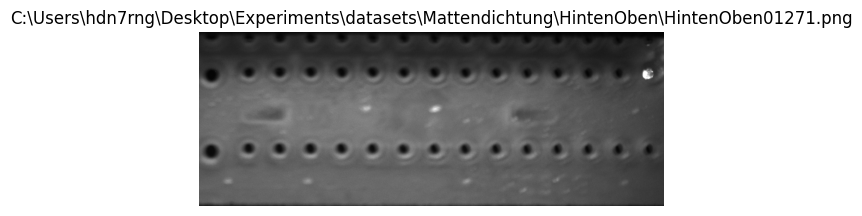

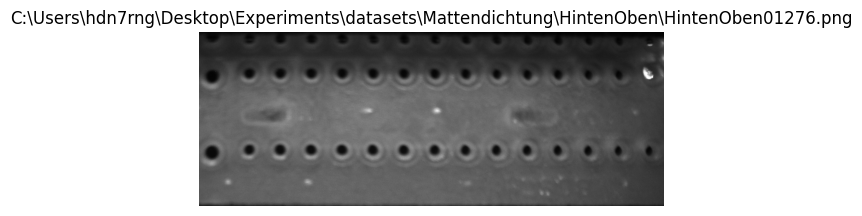

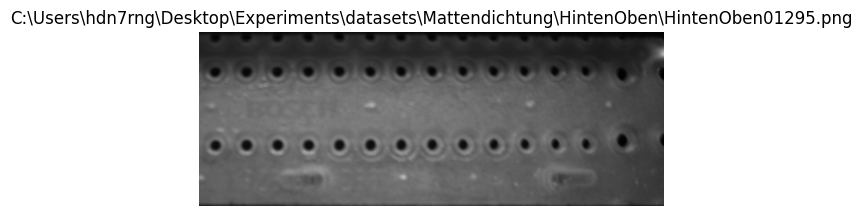

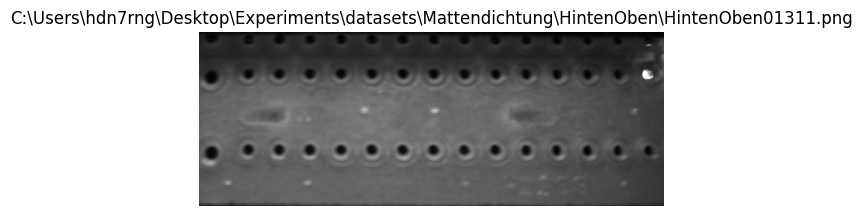

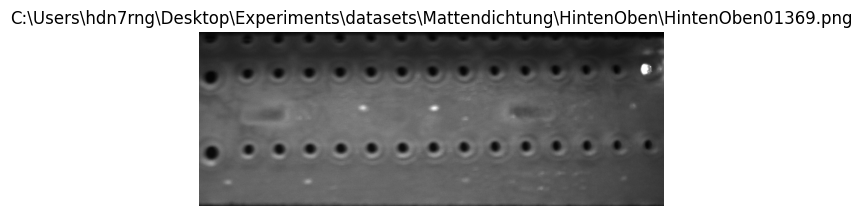

...

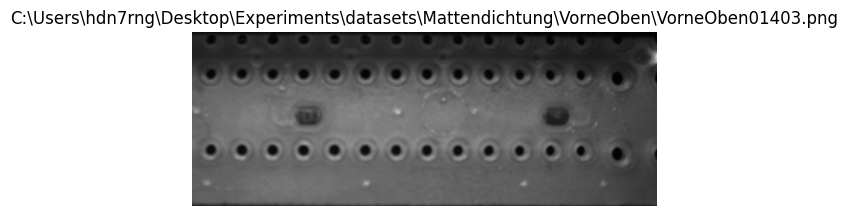

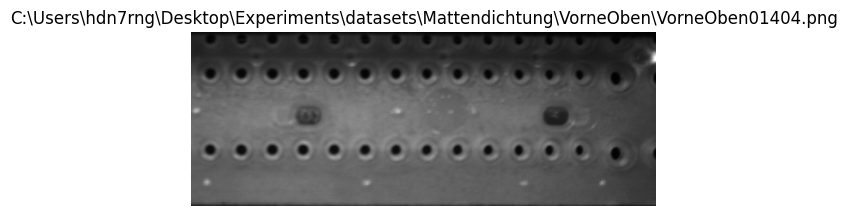

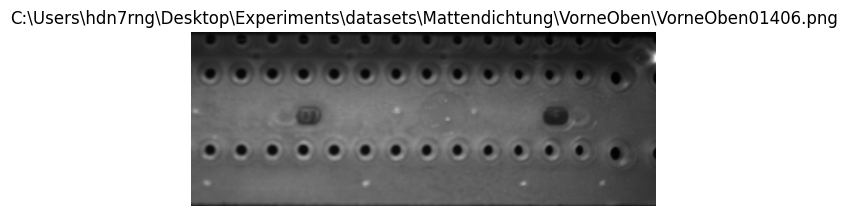

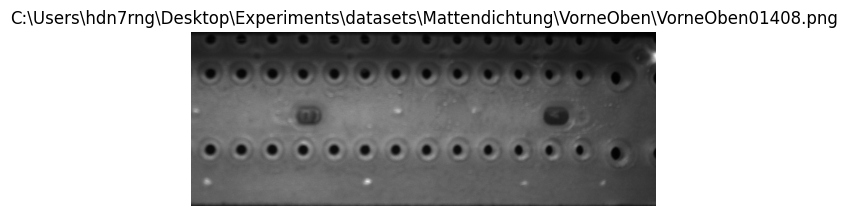

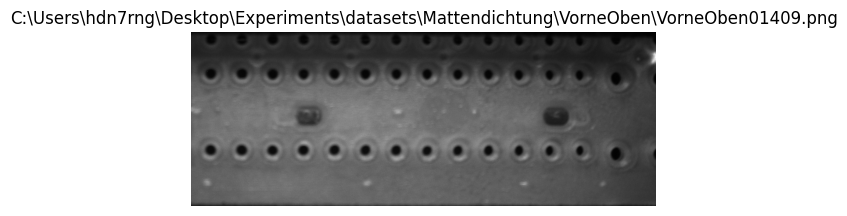

In [43]:
import matplotlib.pyplot as plt
def visualize_images(image_paths):
    for image_path in image_paths:
        # Load and display the image
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
        plt.figure(figsize=(6, 6))
        plt.imshow(image_rgb)
        plt.title(image_path)
        
        plt.axis('off')
        plt.show()


# Call the function to visualize the images
visualize_images(blurry_paths)

### Deleting blurry images
Now the images were deleted from a copy of the dataset


In [66]:
import os

def delete_blurred_images(blurred_paths):
    for image_path in blurred_paths:
        try:
            os.remove(image_path)
            print(f"Deleted {image_path}")
        except OSError as e:
            print(f"Error deleting {image_path}: {e}")

# Call the function to delete the blurred images
delete_blurred_images(blurry_paths)

Deleted C:\Users\hdn7rng\Desktop\Experiments\datasets\Mattendichtung no mislabels copy\HintenOben\HintenOben01123.png
Deleted C:\Users\hdn7rng\Desktop\Experiments\datasets\Mattendichtung no mislabels copy\HintenOben\HintenOben01271.png
Deleted C:\Users\hdn7rng\Desktop\Experiments\datasets\Mattendichtung no mislabels copy\HintenOben\HintenOben01276.png
Deleted C:\Users\hdn7rng\Desktop\Experiments\datasets\Mattendichtung no mislabels copy\HintenOben\HintenOben01311.png
Deleted C:\Users\hdn7rng\Desktop\Experiments\datasets\Mattendichtung no mislabels copy\HintenOben\HintenOben01314.png
Deleted C:\Users\hdn7rng\Desktop\Experiments\datasets\Mattendichtung no mislabels copy\HintenOben\HintenOben01320.png
Deleted C:\Users\hdn7rng\Desktop\Experiments\datasets\Mattendichtung no mislabels copy\HintenOben\HintenOben01335.png
Deleted C:\Users\hdn7rng\Desktop\Experiments\datasets\Mattendichtung no mislabels copy\HintenOben\HintenOben01348.png
Deleted C:\Users\hdn7rng\Desktop\Experiments\datasets\Ma

## Visualizing outliers
Here we tried visualizing the outliers calculated using the Local Outlier factor in high dimension and then plotting them in the lower 2D TSNE representation. Results were not so optimal as LOF fails to find many outliers except with precise fine tuning.

In [48]:
import numpy as np
from sklearn.neighbors import LocalOutlierFactor

def visualize_outliers(self):
    labels = []
    for images, label_batch in self.data:
        labels.extend(label_batch.numpy())

    labels = np.array(labels)

    # Create an instance of the LOF algorithm
    lof = LocalOutlierFactor(n_neighbors=30, contamination='auto')  # Adjust parameters as needed

    # Compute LOF scores for the low-dimensional feature space
    lof_scores = -lof.fit_predict(self.low_dim_feature_space)
    print(lof_scores)
    # Define a threshold to identify outliers (adjust as needed)
    threshold = 0

    # Create an array to store colors based on outliers
    point_colors = np.where(lof_scores > threshold, 'red', 'blue')

    # Create a scatter plot and use point_colors for color mapping
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(
        self.low_dim_feature_space[:, 0],
        self.low_dim_feature_space[:, 1],
        c=point_colors,  # Use point_colors to specify colors
        cmap='viridis',
    )

    class_names = self.class_names

    # Create a dictionary to map class labels to unique colors
    unique_labels = np.unique(labels)
    colors = plt.cm.viridis(np.linspace(0, 1, len(unique_labels)))
    class_color_mapping = {label: color for label, color in zip(unique_labels, colors)}

    # Add legend with custom class names and colors
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', label=class_names[label], markerfacecolor=color, markersize=10)
        for label, color in class_color_mapping.items()
    ]
    plt.legend(handles=legend_elements, loc='upper right')

    plt.title(f't-SNE Visualization of {self.model_name} features')
    plt.xlabel(f'{self.model_name} t-SNE Dimension 1')
    plt.ylabel(f'{self.model_name} t-SNE Dimension 2')
    plt.savefig(f'{self.model_name}.png', dpi=300)
    plt.show()


[-1 -1 -1 ... -1 -1 -1]


C:\Users\hdn7rng\AppData\Local\Temp\ipykernel_14248\3775649623.py:25: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = plt.scatter(


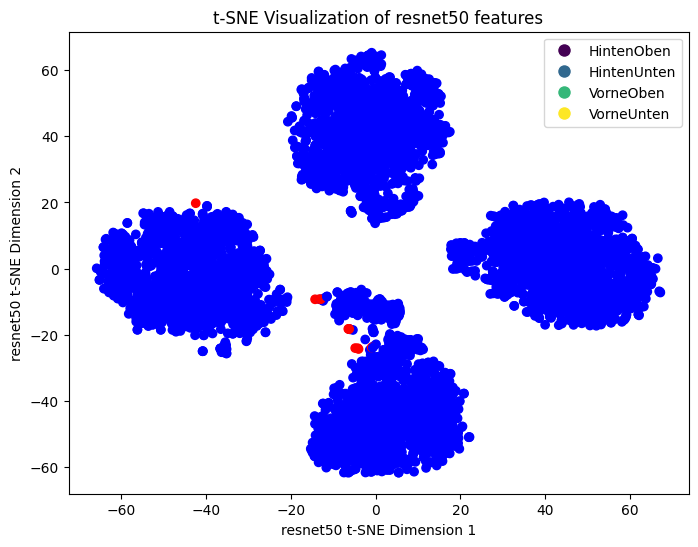

In [49]:
visualize_outliers(resnet_tsne)

In the following cells is te code to calculate the outliers in the high dimension using HDBSCAN and then plotting the outliers in low dim TSNE plot. This gives us better results than using LocalOutlierFactor


In [52]:
import hdbscan

# Create an instance of the HDBSCAN algorithm
hdbscan_clusterer = hdbscan.HDBSCAN(min_samples=10, min_cluster_size=10)  # Adjust parameters as needed
# Fit HDBSCAN to the low-dimensional feature space
hdbscan_labels = hdbscan_clusterer.fit_predict(resnet.features)
hdbscan_labels_low = hdbscan_clusterer.fit_predict(resnet_tsne.low_dim_feature_space)

C:\Users\hdn7rng\AppData\Local\Temp\ipykernel_14248\3159282201.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


<Figure size 800x600 with 0 Axes>

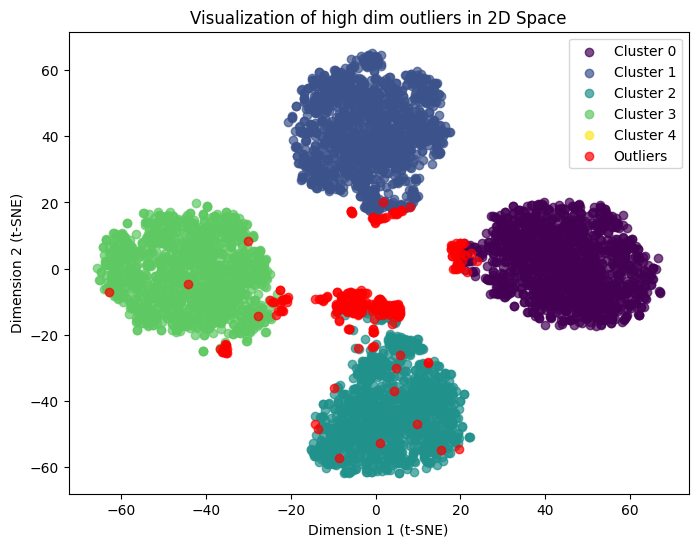

In [62]:
outliers = (hdbscan_labels == -1)
low_dim_features = resnet_tsne.low_dim_feature_space

cmap = plt.get_cmap('viridis')
num_clusters = len(np.unique(hdbscan_labels))
colors = cmap(np.linspace(0, 1, num_clusters))

plt.figure(figsize=(8, 6))

plt.figure(figsize=(8, 6))
for cluster_label in range(num_clusters):
    cluster_mask = (hdbscan_labels == cluster_label)
    plt.scatter(
        low_dim_features[cluster_mask, 0],  # x-coordinates of points in the cluster
        low_dim_features[cluster_mask, 1],  # y-coordinates of points in the cluster
        c=colors[cluster_label],  # Color based on cluster label
        label=f'Cluster {cluster_label}',
        alpha=0.7,  # Adjust transparency if necessary
    )

# Plot non-outliers in one color (e.g., blue)
# plt.scatter(
#     low_dim_features[~outliers, 0],  # x-coordinates of non-outliers
#     low_dim_features[~outliers, 1],  # y-coordinates of non-outliers
#     c='blue',
#     label='Non-Outliers',
#     alpha=0.5,  # Adjust transparency if necessary
# )

# Plot outliers in a different color (e.g., red)
plt.scatter(
    low_dim_features[outliers, 0],  # x-coordinates of outliers
    low_dim_features[outliers, 1],  # y-coordinates of outliers
    c='red',
    label='Outliers',
    alpha=0.7,  # Adjust transparency if necessary
)

plt.title('Visualization of high dim outliers in 2D Space')
plt.xlabel('Dimension 1 (t-SNE)')
plt.ylabel('Dimension 2 (t-SNE)')
plt.legend(loc='upper right')
plt.show()


Failed attempt of implementing the FERM score from : https://ceur-ws.org/Vol-3169/paper10.pdf

In [146]:
import numpy as np

def cosine_similarity(a, b):
    # Calculate the cosine similarity between two vectors a and b
    dot_product = np.dot(a, b)
    magnitude_a = np.linalg.norm(a)
    magnitude_b = np.linalg.norm(b)
    similarity = dot_product / (magnitude_a * magnitude_b)
    return similarity

def calculate_FERM1(class_vectors):
    num_classes = len(class_vectors)
    ferm_sum = 0.0

    for k in range(num_classes):
        class_vectors_k = class_vectors[k]
        m_k = len(class_vectors_k)
        inter_class_similarity_sum = 0.0

        for i in range(m_k):
            for j in range(i + 1, m_k):
                inter_class_similarity_sum += cosine_similarity(class_vectors_k[i], class_vectors_k[j])

        inter_class_similarity_avg = inter_class_similarity_sum / (m_k * (m_k - 1) / 2)

        intra_class_similarity_sum = 0.0
        for i in range(m_k):
            for j in range(i + 1, m_k):
                intra_class_similarity_sum += cosine_similarity(class_vectors_k[i], class_vectors_k[j])

        intra_class_similarity_avg = intra_class_similarity_sum / (m_k * (n - m_k))

        ferm_sum += (inter_class_similarity_avg / intra_class_similarity_avg)

    ferm1 = ferm_sum / num_classes
    return ferm1

# Example usage:
class_vectors = [
    [np.array([1, 2, 3]), np.array([4, 5, 6]), np.array([7, 8, 9])],  # Class 1 vectors
    [np.array([2, 3, 4]), np.array([5, 6, 7]), np.array([8, 9, 10])]  # Class 2 vectors
]

n = 6  # Total number of samples
ferm1_value = calculate_FERM1(class_vectors)
print("FERM 1:", ferm1_value)

FERM 1: 3.0
